# NLE Assignment 2: Distributional Semantics

In this assignment, you will be investigating the *distributional hypothesis*: **words which appear in similar contexts tend to have similar meanings**.

For assessment, you are expected to complete and submit this notebook file. When answers require code, you may import and use library functions (unless explicitly told otherwise). All of your own code should be included in the notebook rather than imported from elsewhere. Written answers should also be included in the notebook. You should insert as many extra cells as you want and change the type between code and markdown as appropriate.

In order to avoid misconduct, you should not talk about the assignment questions with your peers. If you are not sure what a question is asking you to do or have any other questions, please ask me or one of the Teaching Assistants.

Marking guidelines are provided as a separate document.

The first few cells contain code to set-up the assignment and bring in some data. In order to provide unique datasets for analysis by different students, you must enter your candidate number in the following cell. Otherwise do not change the code in these cells.

In [ ]:
candidateno=215816 #this MUST be updated to your candidate number so that you get a unique data sample

In [ ]:
#set up drives for resources.  Change the path as necessary

from google.colab import drive
#mount google drive
drive.mount('/content/drive/')
import sys
sys.path.append('/content/drive/My Drive/NLE Notebooks/resources/')


Mounted at /content/drive/


In [ ]:
#do not change the code in this cell
#preliminary imports

import re
import random
import math
import pandas as pd
import matplotlib.pyplot as plt
from itertools import zip_longest

import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('wordnet_ic')
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.corpus import wordnet as wn
from nltk.corpus import wordnet_ic as wn_ic
brown_ic = wn_ic.ic("ic-brown.dat")


from sussex_nltk.corpus_readers import ReutersCorpusReader

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package wordnet_ic to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet_ic.zip.
Sussex NLTK root directory is /content/drive/My Drive/NLE Notebooks/resources


We are going to be using the Reuters corpus of financial documents for this assignment.  When you run the following cell you should see that it contains 1,113,359 sentences.

In [ ]:
#do not change the code in this cell
rcr = ReutersCorpusReader().finance()
rcr.enumerate_sents()

1113359

The following cell will take 2-5 minutes to run.  It will generate a unique-to-you sample of 200,000 sentences.  These sentences are tokenised and normalised for case and number for you.

In [ ]:
#do not change the code in this cell
def normalise(tokenlist):
    tokenlist=[token.lower() for token in tokenlist]
    tokenlist=["NUM" if token.isdigit() else token for token in tokenlist]
    tokenlist=["Nth" if (token.endswith(("nd","st","th")) and token[:-2].isdigit()) else token for token in tokenlist]
    tokenlist=["NUM" if re.search("^[+-]?[0-9]+\.[0-9]",token) else token for token in tokenlist]
    return tokenlist

random.seed(candidateno)  
samplesize=2000
iterations =100
sentences=[]
for i in range(0,iterations):
    sentences+=[normalise(sent) for sent in rcr.sample_sents(samplesize=samplesize)]
    print("Completed {}%".format(i))
print("Completed 100%")


Completed 0%
Completed 1%
Completed 2%
Completed 3%
Completed 4%
Completed 5%
Completed 6%
Completed 7%
Completed 8%
Completed 9%
Completed 10%
Completed 11%
Completed 12%
Completed 13%
Completed 14%
Completed 15%
Completed 16%
Completed 17%
Completed 18%
Completed 19%
Completed 20%
Completed 21%
Completed 22%
Completed 23%
Completed 24%
Completed 25%
Completed 26%
Completed 27%
Completed 28%
Completed 29%
Completed 30%
Completed 31%
Completed 32%
Completed 33%
Completed 34%
Completed 35%
Completed 36%
Completed 37%
Completed 38%
Completed 39%
Completed 40%
Completed 41%
Completed 42%
Completed 43%
Completed 44%
Completed 45%
Completed 46%
Completed 47%
Completed 48%
Completed 49%
Completed 50%
Completed 51%
Completed 52%
Completed 53%
Completed 54%
Completed 55%
Completed 56%
Completed 57%
Completed 58%
Completed 59%
Completed 60%
Completed 61%
Completed 62%
Completed 63%
Completed 64%
Completed 65%
Completed 66%
Completed 67%
Completed 68%
Completed 69%
Completed 70%
Completed 71%
Co

`generate_features()` will used in the first part of the assignment.

In [ ]:
#do not change the code in this cell
def generate_features(sentences,window=1):
    mydict={}
    for sentence in sentences:
        for i,token in enumerate(sentence):
            current=mydict.get(token,{})
            features=sentence[max(0,i-window):i]+sentence[i+1:i+window+1]
            for feature in features:
                current[feature]=current.get(feature,0)+1
            mydict[token]=current
    return mydict

1) Run `generate_features(sentences[:5])`. With reference to the code and the specific examples, explain how the output was generated [10 marks]

In [ ]:
generate_features(sentences[:5])

{"'s": {'mark': 1, 'traditional': 1},
 ',': {'but': 1, 'official': 1, 'said': 1, 'the': 1},
 '--': {'demand': 1, 'economy': 1, 'hit': 1, 'is': 1},
 '.': {'dtc': 1, 'strength': 1},
 '19,901': {'machinery/': 1, 'up': 1},
 'NUM': {'NUM': 4, 'balance': 1, 'up': 1},
 'analysts': {'said': 1, 'the': 1},
 'and': {'slack': 1, 'unemployment': 1},
 'balance': {'NUM': 1, 'trade': 1},
 'book': {'entry': 1, 'is': 1},
 'but': {',': 1},
 'by': {'hit': 1, 'record': 1},
 'current': {'weekly/monthly': 1, 'year-ago': 1},
 'demand': {'--': 1, 'domestic': 1},
 'do': {'little': 1, 'statements': 1},
 'domestic': {'demand': 1, 'slack': 1},
 'dtc': {'.': 1, 'through': 1},
 'economy': {'--': 1, 'german': 1},
 'entry': {'book': 1, 'through': 1},
 'fact': {'that': 1, 'the': 1},
 'german': {'economy': 1, 'sputtering': 1},
 'hide': {'the': 1, 'to': 1},
 'hit': {'--': 1, 'by': 1},
 'is': {'--': 1, 'book': 1, 'issue': 1, 'unable': 1},
 'issue': {'is': 1, 'this': 1},
 'little': {'do': 1, 'to': 1},
 'machinery/': {'19,9

In [ ]:
sentences[0:0]+sentences[1:2]+sentences[0:1]+sentences[2:3]+sentences[1:2]+sentences[3:4]+sentences[2:3]+sentences[4:5]

[['this', 'issue', 'is', 'book', 'entry', 'through', 'dtc', '.'],
 ['trade', 'balance', 'NUM', 'NUM', 'NUM'],
 ['but',
  ',',
  'the',
  'analysts',
  'said',
  ',',
  'official',
  'statements',
  'do',
  'little',
  'to',
  'hide',
  'the',
  'fact',
  'that',
  'the',
  'sputtering',
  'german',
  'economy',
  '--',
  'hit',
  'by',
  'record',
  'post-war',
  'unemployment',
  'and',
  'slack',
  'domestic',
  'demand',
  '--',
  'is',
  'unable',
  'to',
  'sustain',
  'the',
  'mark',
  "'s",
  'traditional',
  'strength',
  '.'],
 ['this', 'issue', 'is', 'book', 'entry', 'through', 'dtc', '.'],
 ['n.america', 'machinery/', '19,901', 'up', 'NUM'],
 ['but',
  ',',
  'the',
  'analysts',
  'said',
  ',',
  'official',
  'statements',
  'do',
  'little',
  'to',
  'hide',
  'the',
  'fact',
  'that',
  'the',
  'sputtering',
  'german',
  'economy',
  '--',
  'hit',
  'by',
  'record',
  'post-war',
  'unemployment',
  'and',
  'slack',
  'domestic',
  'demand',
  '--',
  'is',
  'u

In [ ]:
generate_features(sentences[:5],2)

{"'s": {'mark': 1, 'strength': 1, 'the': 1, 'traditional': 1},
 ',': {'analysts': 2,
  'but': 1,
  'official': 1,
  'said': 1,
  'statements': 1,
  'the': 1},
 '--': {'by': 1,
  'demand': 1,
  'domestic': 1,
  'economy': 1,
  'german': 1,
  'hit': 1,
  'is': 1,
  'unable': 1},
 '.': {'dtc': 1, 'strength': 1, 'through': 1, 'traditional': 1},
 '19,901': {'NUM': 1, 'machinery/': 1, 'n.america': 1, 'up': 1},
 'NUM': {'19,901': 1, 'NUM': 6, 'balance': 2, 'trade': 1, 'up': 1},
 'analysts': {',': 2, 'said': 1, 'the': 1},
 'and': {'domestic': 1, 'post-war': 1, 'slack': 1, 'unemployment': 1},
 'balance': {'NUM': 2, 'trade': 1},
 'book': {'entry': 1, 'is': 1, 'issue': 1, 'through': 1},
 'but': {',': 1, 'the': 1},
 'by': {'--': 1, 'hit': 1, 'post-war': 1, 'record': 1},
 'current': {'weekly/monthly': 1, 'year-ago': 1},
 'demand': {'--': 1, 'domestic': 1, 'is': 1, 'slack': 1},
 'do': {'little': 1, 'official': 1, 'statements': 1, 'to': 1},
 'domestic': {'--': 1, 'and': 1, 'demand': 1, 'slack': 1},
 

It is returning a dictionary of dictionaries, where the key of the outermost dictionary is a word, the key of each internal dictionary is a co-occurrence feature, another word, and the value in the internal dictionary is the number of times the words co-occur together, within the given window, in this case 1. NUM appears 4 times, because when get_features is called, there are 3 nums, because it appears next to each other 3 times. As we can see from the example of the times generate_features is executed, with a sample of 5 sentences: 1st "NUM" has "balance" as prior and "NUM" as next token (+1 "NUM" next) second "NUM" has "NUM" as prior and next token (+1 "NUM" prior and +1 "NUM" next) and the 3rd "NUM" has "NUM" as prior and next is empty (+1 "NUM" prior). So if we count all of the "NUM" that have appeared as prior and next token, we get a value of 4.  **Note**, when a token which appears in one sentence also appears in another sentence e.g "NUM", the dicitonary will mention all of the tokens in sample sentence which appear before or after that specific token. In the case of "NUM", it has "NUM", "balance" and "up" as prior and posterior tokens.**Note** the bigger the window, the more co-occuring features appear in each words, as seen in the example provided above with a window of 2.

Now in terms of understanding the code in genereate_features(). What the code does first is initialise a new dicitionary, which takes the neighbouring tokens (in a range of 1,default value) of a word, and the times that certain word occurs. Then, it loops around all of the sentences in the corpus, and each word in each sentence, and the words which appear in the range of that token are added to the variable **feature**. Finally every feature and its occcurences are added to the token which includes those certain features in its window.

2) Write code and **find** the 1000 most frequently occurring words that
* are in your sample; AND
* have at least one noun sense according to WordNet [10 marks]

In [ ]:
import operator
def freq_dist(sentences):
####
#Finds the frequency of each token occuring.
#param sentences: The sentences of the corpus to be tokenised and get the frequencies of each token

#return: A dictionary of frequencies, where the keys are tokens and the values is the frequency of those tokens
###
  mydict={}
  for sentence in sentences:
    for token in sentence:
      if (len(wn.synsets(token,wn.NOUN))>0):      #Only add tokens with noun senses, add to the dictionary
        mydict[token]=mydict.get(token,0)+1
  return mydict

def most_frequent(freqdist,k=1000):
###
#Returns the top 1000 nouns of the corpus.
#param freqdist: A dictionary of tokens and their frequencies
#param k=1000: The number of words returned, default value is 1000

#return:The top most frequent 1000 words (default) in the corpus
###
  sorted_list = sorted(freqdist.items(),key=operator.itemgetter(1),reverse=True)[:k]    #Sorts the list from most to least frequent
  return [word for word,freq in sorted_list]
  
most_frequent(freq_dist(sentences))

['in',
 'a',
 'percent',
 'it',
 'be',
 'pct',
 'at',
 'was',
 'he',
 'will',
 'as',
 'bank',
 'are',
 'year',
 'million',
 'have',
 'has',
 'may',
 'its',
 'government',
 'an',
 'billion',
 'tax',
 'uk',
 'trade',
 'rate',
 'budget',
 'more',
 'growth',
 'u.s.',
 'first',
 'last',
 'central',
 'market',
 'june',
 'price',
 'there',
 'over',
 'or',
 'state',
 'union',
 'newsroom',
 'inflation',
 'bonds',
 'rates',
 'minister',
 'prices',
 'no',
 'interest',
 'week',
 'one',
 'can',
 'economy',
 'april',
 'i',
 'two',
 'finance',
 'currency',
 'deficit',
 'gdp',
 'tuesday',
 'european',
 'years',
 'july',
 'time',
 'wednesday',
 'march',
 'official',
 'out',
 'thursday',
 'change',
 'current',
 'who',
 'sales',
 'apr',
 'index',
 'total',
 'policy',
 'rise',
 'three',
 'issue',
 'month',
 'due',
 'mon',
 'fri',
 'monday',
 'unemployment',
 'president',
 'public',
 'international',
 'investment',
 'balance',
 'months',
 'country',
 'debt',
 'consumer',
 'do',
 'friday',
 'company',
 'cap

In [ ]:
#do not change the code in this cell.  It relates to Q3
wordpair=("house","garden")
concept_1=wn.synsets(wordpair[0])[0]
concept_2=wn.synsets(wordpair[1])[0]
print("Path similarity between 1st sense of {} and 1st sense of {} is {}".format(wordpair[0],wordpair[1],wn.path_similarity(concept_1,concept_2)))
print("Resnik similarity between 1st sense of {} and 1st sense of {} is {}".format(wordpair[0],wordpair[1],wn.res_similarity(concept_1,concept_2, brown_ic)))
print("Lin similarity between 1st sense of {} and 1st sense of {} is {}".format(wordpair[0],wordpair[1],wn.lin_similarity(concept_1,concept_2, brown_ic)))

Path similarity between 1st sense of house and 1st sense of garden is 0.08333333333333333
Resnik similarity between 1st sense of house and 1st sense of garden is 1.2900256809649917
Lin similarity between 1st sense of house and 1st sense of garden is 0.15380807721262396


3) Consider the code above which outputs the path similarity score, the Resnik similarity score and the Lin similarity score for a pair of concepts in WordNet.  Answer the following questions.

a) Explain what each of the numbers in the output means.

b) Write code to find the semantic similarity of a pair of words according to WordNet with a parameter to specify the measure of semantic similarity between concepts.  Explain and justify the strategy used for words which have multiple senses.

c) Choose one of the measures of semantic similarity and then for every possible pair of words identified in Q2, determine the semantic similarity of the pair according to WordNet.  Justify your choice of semantic similarity measure.

d) Identify the 10 most similar words (according to WordNet) to the most frequent word in the corpus [20 marks]

**a)**The number which appears in the **path similarity**, is the calculation of the similarity between two words (nouns in this case), which is calculated by 1/1+(distance between house and garden nouns in the noun hierachy), the bigger the result, the more similar two words are. The **Resnik similarity**, also calculates the similarity between two words, but this time Infomation Content is used to calculate it. Information Content is calculated by getting the probability of certain concepts and all of its hypernyms occuring in various documents; the Information Content is smaller at the top of the hierarchy and higher at the bottom of the hierarchy. This is like this because, hyponyms "carnivore" for example, gives us more information about a document than its hypernym "vertebrate". In short, the Resnik Similarity calculates the information content of the lowest common subsumer (lowest hypernym in the tree which 2 concepts share); Resnik similarity("garden","house") = -log*P*(Lowest Common Subsumer("garden","house")). Finally the **Lin similarity** is calculated in the following way:

Lin Similarity = 2*Res similarity("house","garden)/(Information Content of "house"+ Information Content of "garden")

What this calculates is the ratio of the shared information content to total information content. For example it tells you that there is the words "dog" and "poodle" are more similar than "poodle" and "tiger".

In [35]:
def semantic_similarity(word1,word2,measurement = "path"):
###
#Finds the WordNet semantic similarity of 2 words for a type of similarity
#param word1: A random word
#param word2: Another random word
#param measurement='path': The similarity for a specific type, default 'path'

#return:The most similar pair of senses of each word for a certain similarity type (default = 'path')
###

  word_types = [wn.NOUN,wn.VERB]  #You can only find the semantic similarity of either nouns or verbs
  max = 0
  for word in word_types:
    synsets1 = wn.synsets(word1,word)
    synsets2 = wn.synsets(word2,word)
    for synset1 in synsets1:      #For every synset in word1 and word2
      for synset2 in synsets2:
        if measurement == "path":                           #Choose the path specified in the parameter
          similarity = wn.path_similarity(synset1, synset2)             
        elif measurement == "Resnik":
          similarity = wn.res_similarity(synset1, synset2, brown_ic)
        elif measurement == "Lin":
          similarity = wn.lin_similarity(synset1,synset2, brown_ic)
    
        if similarity>max:              #Semantic similarity in WordNet is found by finding biggest similarity between two senses in two words
          max = similarity
    
  return max

semantic_similarity("months","week","Lin")

0.5079853940361619

**b)** Calculating the similarity of 2 words, is defined as the maximum similarity of all possible sense pairings, which means, that the function returns the highest similarity between 2 words in a measurement. In order not to be any errors when finding similarity, I have divided all of the sense types of each word (Verb and noun), so that when finding similarity between 2 words, it finds the similarity in the same word type. So to do this I just got one sense of one word, compared the similarity of that sense with each sense of the 2nd word, stored the highest similarity between 2 words in the variable max, and repeated again.

In [ ]:
print("For question 3 c), I choose LIN SIMILARITY\n")
q2_words = most_frequent(freq_dist(sentences))

def compare(speech):
###
#Compare each and one of each words and senses in the 1000 most frequent words with at leas one noun sense in the corpus

#return: The pair of words and their LIN Similarity
###
### IMPORTANT: I chose LIN SIMILARITY to find the similarity between each word ###
  word_freq = []
  i = 1
  for word1 in q2_words:            #Bubble sort loop, does the first word and all of its senses, compares to the rest of the words and their senses. Once the first words has compared
    for word2 in q2_words[i:]:      #everything, do the next word and each of its senses and compare to the rest of the words, except for the previous, as it has already been compared.
      for synset1 in wn.synsets(word1,speech):
        for synset2 in wn.synsets(word2,speech):
            similarity = wn.lin_similarity(synset1,synset2,brown_ic)
            if speech == wn.NOUN:
              word_freq.append(["Noun",word1,word2,similarity])       #If word has noun sense
            elif speech == wn.VERB:
              word_freq.append(["Verb",word1,word2,similarity])       #If word has verbe sense, we can't use adjectives and adverbs


    i+=1
  return word_freq
print(compare(wn.NOUN)[:2020])      ###IMPORTANT, I am only printin the first 2020 words of the algorithm, it does comparisons for every word, but only prints out a certain number, otherwise IOpub runtime would be exceeded.
print(compare(wn.VERB)[:2020])



For question 3 c), I choose LIN SIMILARITY

[['Noun', 'in', 'a', 1.212135992825787e-299], ['Noun', 'in', 'a', -0.0], ['Noun', 'in', 'a', 1.1924584157955451e-300], ['Noun', 'in', 'a', 1.1924584157955451e-300], ['Noun', 'in', 'a', 0.38755138887405405], ['Noun', 'in', 'a', 1.1924584157955451e-300], ['Noun', 'in', 'a', 0.05437578230669698], ['Noun', 'in', 'a', 1.1924584157955451e-300], ['Noun', 'in', 'a', 6.67341181360592e-300], ['Noun', 'in', 'a', 7.771714095273065e-300], ['Noun', 'in', 'a', 7.771714095273065e-300], ['Noun', 'in', 'a', 0.04699185772583189], ['Noun', 'in', 'a', 1.1924584157955451e-300], ['Noun', 'in', 'a', 0.3084805516002733], ['Noun', 'in', 'a', -0.0], ['Noun', 'in', 'a', 1.6035182299077988e-300], ['Noun', 'in', 'a', 1.6035182299077988e-300], ['Noun', 'in', 'a', 1.6035182299077988e-300], ['Noun', 'in', 'a', -0.0], ['Noun', 'in', 'a', -0.0], ['Noun', 'in', 'a', 0.06641557396123841], ['Noun', 'in', 'percent', 0.06272075048894535], ['Noun', 'in', 'percent', 0.272635187645978

**c)** The reason I chose Lin similarity, is because unlike Path similarity, it does not rely on the distance in the hierarchy between 2 words, and, unlike resnik sikmilarity, it calculates the ratio of shared information content to total information content, instead of finding the information content of what 2 concepts share. Plus, it is also helpful to me when creating the scatter plot for the last excercise, as the calue of Lin similarity, cannot go over 1.0.

In [ ]:
def most_similar_top(target="in",k=10):
###
#Finds the most similar words in the corpus to the most frequent word
#param target: The target word, in this case the most frequent in the corpus ("in")
#param k=10: default value 10 of the most similar words in the corpus
#return: A nested list, with the most similar words (default:10) and their similarity to the most frequent word in the corpus
###

  only_target = []
  for (speech,word_target,other,sim) in compare(wn.NOUN):     #We are only using noun senses for this one, because the question asks for the most similar words, which is "in" and the word in has no verb senses
    if word_target==target:
      only_target.append([other,sim])         #As mentioned in the above excersice, every word "in" will appear comparing to every other word in the 1000 most frequent words, thus when returning the list, "in" is always going to appear first
  highest_10 = []
  for i in range(k):
    max = 0
    for (a_most_sim,lin_sim) in only_target:
      if lin_sim>max:
        max = lin_sim       #As we are using compare(wn.NOUN) method, it will only give us the wordnet similarity for LIN SIMILARITY
        most_sim = a_most_sim
    highest_10.append([most_sim,max])
    only_target.remove([most_sim,max])      #Remove the most similar word in the list, to ensure it does not appear again when we add most similar words to the lsit
  return highest_10


most_similar_top("in")

[['points', 0.6891711624383831],
 ['point', 0.6891711624383831],
 ['head', 0.6885721434175492],
 ['pace', 0.6487297259131425],
 ['unit', 0.6328693668433236],
 ['was', 0.6062080080943216],
 ['washington', 0.6062080080943216],
 ['state', 0.60551929298177],
 ['states', 0.60551929298177],
 ['be', 0.5965171994779592]]

4)a) Write code to construct distributional vector representations of words in the corpus with a parameter to specify context size.  Explain how you calculate the value of association between each word and each context feature.

b) Use your code to construct representations of the 1000 words identified in Q2 with a window size of 1 

c) Use your representations to find the 10 words which are distributionally most similar to the most frequent word in the corpus. [15 marks]

In [ ]:
def dot(vecA,vecB):
###
#Returns the whole sum of every value in VecA parameter times the value of VecB parameter
#param vecA: Dictionary with any object as keys (in this case token, see later) and number values (in this case float, see later)
#param vecB: Dictionary with any object as keys (in this case token, see later) and number values (in this case float, see later)

#return: the sum of the values
###
  the_sum=0
  for (key,value) in vecA.items():
      the_sum+=value*vecB.get(key,0)
  return the_sum

class word_vectors:
  ###
  #Representation of a word in a space of n dimensions, n being features of that certain word
  ###
    def __init__(self,sentences,window=3):
      ###
      #param sentences: The sentences in the corpus
      #param window: The size of the surrounding words of a certain word, default value 3
      ###
        self.sentences=sentences
        self.window=window
        self.reps={}
        self.wordtotals={}
        self.feattotals={}
        self.generate_features()
        self.grandtotal=sum(self.wordtotals.values())
        self.convert_to_ppmi()
    
    def generate_features(self):
      ###
      #Generates features of each token according to window size
      ###
        for sentence in self.sentences:
            for i,token in enumerate(sentence):
                current=self.reps.get(token,{})
                features=sentence[max(0,i-self.window):i]+sentence[i+1:i+self.window+1]
                for feature in features:
                    current[feature]=current.get(feature,0)+1
                    self.feattotals[feature]=self.feattotals.get(feature,0)+1
                self.wordtotals[token]=self.wordtotals.get(token,0)+len(features)
                self.reps[token]=current

    def convert_to_ppmi(self):
      ###
      #Convert word representations into PPMI
      ###
        self.ppmi={word:{feat:max(0,math.log((freq*self.grandtotal)/(self.wordtotals[word]*self.feattotals[feat]),2)) for (feat,freq) in rep.items()} for (word,rep) in self.reps.items()}
    
    def similarity(self,word1,word2):
      ###
      #Distributional similarity between 2 words
      #param word1: A random word in the corpus
      #param word2: Another random word in the corpus

      #return: The similarity between the words entered in the parameter
      ###
        rep1=self.ppmi.get(word1,{})
        rep2=self.ppmi.get(word2,{})
        return 0 if dot(rep1,rep1) == 0 or dot(rep2,rep2) == 0 else dot(rep1,rep2)/math.sqrt(dot(rep1,rep1)*dot(rep2,rep2))   #In order not to be an error, return 0 if there is no similarity between 2 words
    
    def nearest_neighbours(self,word1,n=1000,k=10):
      ###
      #Return 10 most similar words in the corpus from the word entered in the parameter
      #param word1: A random word in the corpus
      #param n=1000: Get the 1000 most frequent words in the corpus, 1000 default value
      #param k=10: Get the 10 words most similar to the word entered

      #returns: The most similar 10 words (default values) of the words entered in the parameter
      ###
        candidates=sorted(self.wordtotals.items(),key=operator.itemgetter(1),reverse=True)[:n]
        sims=[(cand,self.similarity(word1,cand)) for (cand,_) in candidates]
        return sorted(sims,key=operator.itemgetter(1),reverse=True)[:k]

**a)** To calculate the association between a representation and its feature, we calculate their PPMI, which returns the level of association between a representation and its feature. The way that it is calcualted is the log based 2 of the total occurrences of all words times the frequency of a representation and a certain feature divided by the total occurences of a feature with different representations times the total ocurrences of the representation with different features. That is how it is calculated, as we can see below for the 1000 words, the association between in and falls is 2.22.

In [ ]:
# Representation of the 1000 words in q2

vectors_1 = word_vectors(sentences,1)
rep_1000 = []
for word in most_frequent(freq_dist(sentences)):
  rep_1000.append([word,vectors_1.ppmi[word]])
rep_1000


[['in',
  {'falls': 2.2170674527466874,
   'official': 0,
   'volatility': 2.879510306922086,
   'the': 1.4818599822392768,
   'percent': 2.2339930552872698,
   'june': 2.8282182245555907,
   'august': 2.273507078560356,
   'amounts': 0.9079077199315952,
   'billion': 1.8618189164746306,
   'slump': 3.976857263530608,
   'more': 0,
   'troubles': 2.775737640484701,
   'its': 1.2321188863765138,
   'significance': 2.0831661656769485,
   'opened': 1.4494443530359367,
   'uganda': 2.0759706642727447,
   'now': 0,
   'currencies': 1.6908487428981882,
   'rebound': 3.650206758400842,
   'stocks': 1.7249745268028145,
   'mine': 1.5456508273582523,
   'southern': 2.2667712565078273,
   'headquarters': 2.243206578187417,
   'lisbon': 0.775737640484701,
   'warburg': 1.605118868872304,
   'london': 2.3217974488935242,
   'viewed': 1.6303072009631372,
   'deposits': 0.7561278914168041,
   'f.x': 4.820131759843155,
   'exist': 0.23516925912199813,
   'other': 0.5861485214854463,
   'growth': 2.24

In [ ]:
#Find the most similar words to the most frequent word in q2

dis_most_sim = vectors_1.nearest_neighbours('in',1000,11)   #We do 11 most similar words, because the most similar word is going to be the word entered, so put 11 in and print the most similar words except for the same word
print(dis_most_sim[1:])


[('.', 0.14811176449733823), ('and', 0.13878033871063966), ('of', 0.1240962523030894), (',', 0.11783218053169568), ('from', 0.11770292644492537), ('on', 0.1155265016598248), ('were', 0.10635126170016079), ('for', 0.1044340455800685), ('with', 0.10264859866975234), ('by', 0.10249444205083534)]


5) Plan and carry out an investigation into the correlation between semantic similarity according to WordNet and distributional similarity with different context window sizes. You should make sure that you include a graph of how correlation varies with context window size and that you discuss your results. [25 marks]

# Plan of Experiment

To begin with, I decided to take random samples of all of the sentences in the corpus. The reason I have chosen to only choose 300 sentences, is because if I took any more than that, I'd have to wait quite a long time for the code to process (with a sample of 300 sentences, it takes around 10 minutes to process the code). After choosing sentences at random, we break down the sentences into tokens and append them to a list. Next we create word vectors of different window sizes (I could have chosen bigger window sizes, not too big however e.g 100 as the window size would be bigger than the sentence itself, however, with window size 15 for example, the code takes a long time to generate.

After constructing the word vectors, we enter bubble sort for loop (so when calculating word similarity, it doesn't calculate the similarity for a pair of words twice, and we calculate the similarity of every word in the random sentences.

Finally we create a data frame and a scatter plot.

In [23]:
random_words = []
random_sentences = random.sample(sentences,300)   #Take 300 random sentences from the sentences in the corpus
for sentence in random_sentences:
  for word in sentence:
    if len(wn.synsets(word,wn.NOUN))>0:
      random_words.append(word)
  
vectors_1 = word_vectors(random_sentences,1)    #Word vectors with window sizes 1,2,3 and 4
vectors_2 = word_vectors(random_sentences,2)
vectors_3 = word_vectors(random_sentences,3)
vectors_4 = word_vectors(random_sentences,4)

sim_list = []
for i in range(0,len(random_words)):
  j = 0
  for j in range(j+i+1,len(random_words)):
    sim_list.append([random_words[i],random_words[j],semantic_similarity(random_words[i],random_words[j],"Lin"),vectors_1.similarity(random_words[i],random_words[j]),vectors_2.similarity(random_words[i],random_words[j]),vectors_3.similarity(random_words[i],random_words[j]),vectors_4.similarity(random_words[i],random_words[j])])
df=pd.DataFrame(sim_list,columns=["word1","word2","WordNet Similarity","Dist Sim w1","Dist Sim w2","Dist Sim w3","Dist Sim w4"])  #Create dataframe
df


,word1,word2,WordNet Similarity,Dist Sim w1,Dist Sim w2,Dist Sim w3,Dist Sim w4
0,it,find,5.289042e-300,0.000000,0.110857,0.098079,0.084918
1,it,policies,6.584563e-300,0.000000,0.000043,0.001813,0.062748
2,it,crisis,3.185510e-300,0.000000,0.000000,0.002999,0.001661
3,it,wooing,3.185510e-300,0.000000,0.000000,0.000000,0.001525
4,it,clients,0.000000e+00,0.000000,0.000000,0.000000,0.002123
...,...,...,...,...,...,...,...
2231323,take,weekly,0.000000e+00,0.000000,0.000000,0.003844,0.001658
2231324,take,week,7.459686e-02,0.000000,0.000000,0.011663,0.008156
2231325,months,weekly,0.000000e+00,0.000000,0.011812,0.008672,0.003847
2231326,months,week,5.079854e-01,0.057059,0.021434,0.013220,0.008169


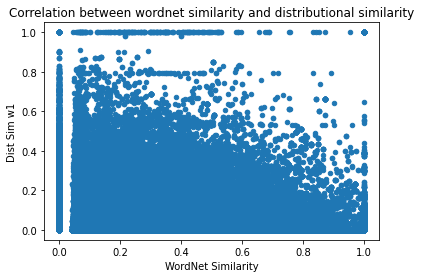

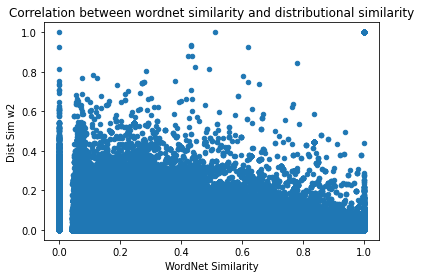

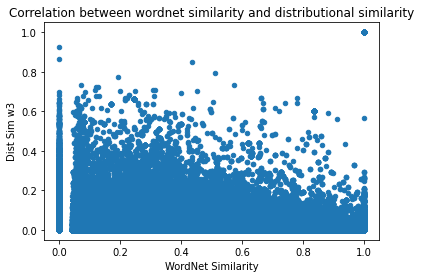

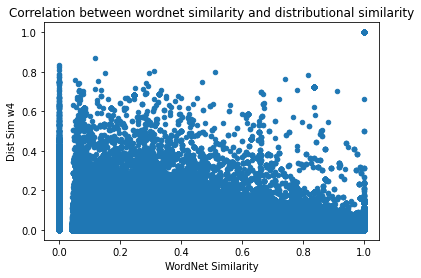

In [24]:
def sim_scatter(x,y,title):   
  '''
  Create scatter plot of WordNet similarity and distributional similarity
  param x: A type of semantic similarity
  param y: Another type of semantic similarity

  param title: title of the scatter plot
  '''

  df[x]=df[x].map(float)
  df[y]=df[y].map(float)
    
  df.plot.scatter(x,y)
  plt.title(title)


dist_types = ["Dist Sim w1","Dist Sim w2","Dist Sim w3","Dist Sim w4"]
for dis in dist_types:
  if dis == "Dist Sim w1":
    df[dis] = [ds_1 for (word1,word2,wn_sim,ds_1,ds_2,ds_3,ds_4) in sim_list]
  elif dis == "Dist Sim w2":
    df[dis] = [ds_2 for (word1,word2,wn_sim,ds_1,ds_2,ds_3,ds_4) in sim_list]
  elif dis == "Dist Sim w3":
    df[dis] = [ds_3 for (word1,word2,wn_sim,ds_1,ds_2,ds_3,ds_4) in sim_list]
  else:
    df[dis] = [ds_4 for (word1,word2,wn_sim,ds_1,ds_2,ds_3,ds_4) in sim_list]
  sim_scatter('WordNet Similarity',dis,'Correlation between wordnet similarity and distributional similarity')


In [25]:
df.corr(method = 'spearman')  #Do a spearman correlation of distributional and WordNet semantics

,WordNet Similarity,Dist Sim w1,Dist Sim w2,Dist Sim w3,Dist Sim w4
WordNet Similarity,1.000000,0.044708,0.067852,0.060869,0.065970
Dist Sim w1,0.044708,1.000000,0.590607,0.479222,0.418793
Dist Sim w2,0.067852,0.590607,1.000000,0.780542,0.664456
Dist Sim w3,0.060869,0.479222,0.780542,1.000000,0.847087
Dist Sim w4,0.065970,0.418793,0.664456,0.847087,1.000000


# Conclusion

As we can observe from the scatter plot, there is a negative correlation  between WordNet similarity and all of the distributional similarity with different window sizes, meaning there is very little association between WordNet and distributional similarity (Clearer image in Spearman's table correlation above, correlation between all distributional similarities and word net similarity is under 0.1). Seeing in scatter graph, there are words which according to WordNet, they are very similar and to distributional similarity not similar at all and vice versa, however with larger window sizes, you can see that the scatter plot slope isn't that high up anymore.

In [36]:
##This code will word count all of the markdown cells in the notebook saved at filepath
##Running it before providing any answers shows that the questions have a word count of 388

import io
from nbformat import current

filepath="/content/drive/My Drive/NLE Notebooks/NLE assignment/NLEassignment2.ipynb"
question_count=568

with io.open(filepath, 'r', encoding='utf-8') as f:
    nb = current.read(f, 'json')

word_count = 0
for cell in nb.worksheets[0].cells:
    if cell.cell_type == "markdown":
        word_count += len(cell['source'].replace('#', '').lstrip().split(' '))
print("Submission length is {}".format(word_count-question_count))

Submission length is 1114


In [37]:
print("The lenght of my submissions is {} words".format(word_count-question_count))

The lenght of my submissions is 1114 words
